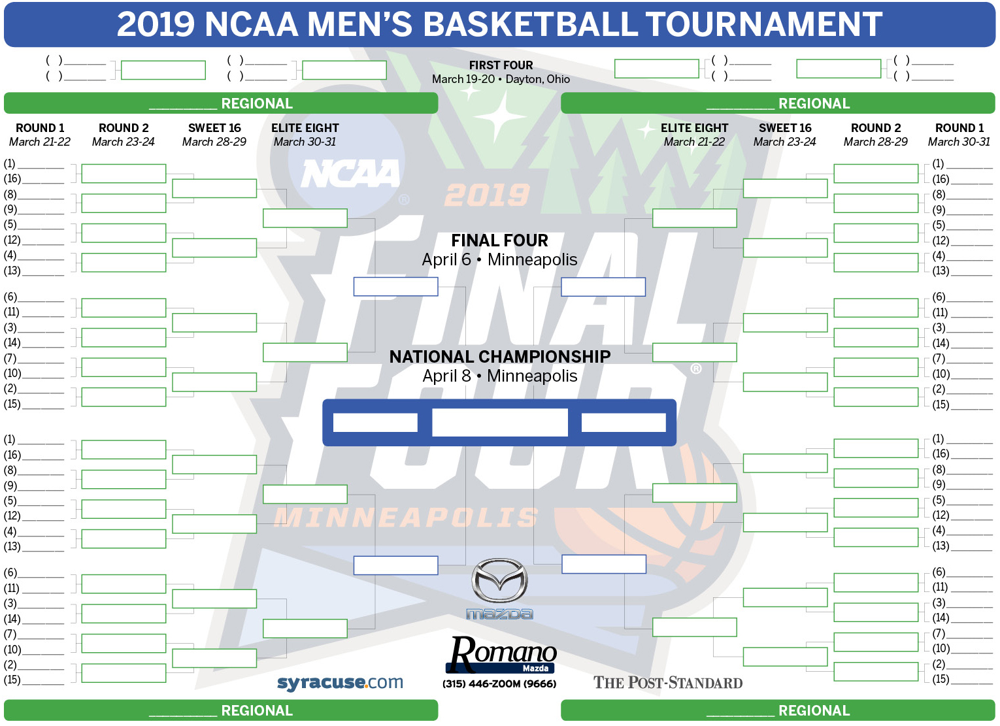

In [91]:
 url = 'https://graphics.advancemediany.com/2019/images/2019_NCAA_tournament_bracket_mens_basketball_blank.jpg'
from PIL import Image
import requests
from io import BytesIO

response = requests.get(url)
img = Image.open(BytesIO(response.content))
img

# Load and Explore Data

### Import dependancies
### define columns and prediction classes

In [92]:



import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sklearn
from sklearn import svm
from sklearn import model_selection
from sklearn.model_selection import train_test_split
#!pip install seaborn
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import
from matplotlib.ticker import LinearLocator
import statsmodels.formula.api as sm
#!pip install xgboost
from matplotlib import pyplot
import xgboost as xgb
from sklearn import preprocessing
from sklearn import svm
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.datasets import load_digits
from sklearn.model_selection import learning_curve
from sklearn.model_selection import ShuffleSplit
  


In [93]:
df = pd.read_csv('https://raw.githubusercontent.com/mkearney/ncaa_bball_data/master/data/ncaa-team-data.csv')
pd.set_option('display.max_columns', None)
df.head(10)



,season,conf,w,l,wl,w_conf,l_conf,wl_conf,srs,sos,pts,pts_vs,ap_pre,ap_high,ap_final,ncaa_tournament,seed,coaches,seeded,year,is_ap_pre,is_ap_high,is_ap_final,pts_diff,school,pts_total
0,2018-19,Southland,27,6,0.818,14.0,4.0,0.778,-1.280000,-8.100000,74.5,63.1,30,30,30,0,15,Joe Golding,True,2019,False,False,False,11.4,abilene-christian,137.6
1,2017-18,Southland,16,16,0.500,8.0,10.0,0.444,-9.140000,-6.820000,73.7,71.2,30,30,30,0,20,Joe Golding,False,2018,False,False,False,2.5,abilene-christian,144.9
2,2016-17,Southland,13,16,0.448,7.0,11.0,0.389,-11.860000,-7.100000,69.3,71.5,30,30,30,0,20,Joe Golding,False,2017,False,False,False,-2.2,abilene-christian,140.8
3,2015-16,Southland,13,18,0.419,8.0,10.0,0.444,-13.930000,-7.530000,71.3,73.3,30,30,30,0,20,Joe Golding,False,2016,False,False,False,-2.0,abilene-christian,144.6
4,2014-15,Southland,10,21,0.323,4.0,14.0,0.222,-17.200000,-6.340000,63.7,70.5,30,30,30,0,20,Joe Golding,False,2015,False,False,False,-6.8,abilene-christian,134.2
5,2013-14,Southland,11,20,0.355,2.0,12.0,0.143,-19.600000,-4.120000,71.4,71.9,30,30,30,0,20,Joe Golding,False,2014,False,False,False,-0.5,abilene-christian,143.3
6,1972-73,Southland,6,20,0.231,2.0,10.0,0.167,-13.760000,-3.160000,78.5,86.7,30,30,30,0,20,Carnie Hatch,False,1973,False,False,False,-8.2,abilene-christian,165.2
7,1971-72,Southland,17,8,0.680,3.0,5.0,0.375,-10.620000,-9.690000,81.4,76.2,30,30,30,0,20,Carnie Hatch,False,1972,False,False,False,5.2,abilene-christian,157.6
8,1970-71,Southland,15,9,0.625,5.0,3.0,0.625,-9.040000,-10.290000,78.3,74.0,30,30,30,0,20,Carnie Hatch,False,1971,False,False,False,4.3,abilene-christian,152.3
9,1969-70-nm,Southland,10,16,0.385,1.0,7.0,0.125,-7.668764,-5.131634,71.1,76.1,30,30,30,0,20,Carnie Hatch,False,1970,False,False,False,-5.0,abilene-christian,147.2


## Feature Variables
#### School - Team name
#### conf - conference which the team plays in
#### rk - seems to count years active backwards - will delete
#### w - amount of wins in the season - will delete
#### l - amount of losses in the season - will delete
#### wl -  win loss ratio over the season 
#### pts_for - avg points scored over a season
#### pts_vs - avg points scored against team over a season
#### pts_total - sum of above two - will use to explain high scoring games
#### season - season played - will modify to hold only first year per season
#### w_conf - wins in conference
#### l_conf - losses in conference
#### wl_conf - win loss ratio in conference
#### srs - ranking based on season difficulty
#### sos -  season difficulty
#### pts - avg points  scored through season
#### ap_pre - associated press rating pre-season
#### ap_high - associated press rating
#### ap_final - associated press rating at the end of a season
#### seed - ranking before tournament
#### coaches - categorical variable for team head coach
#### seeded - binary variable classifying whether team was rankeed
#### year - time variable decribing when the season occured
#### is_ap_pre - binary variable describing whether ap_pre rating was released - will delete
#### is_ap_high - binary variable describing whether ap_high rating was released - will delete
#### is_ap_final - binary variable describing whether ap_final rating was released - will delete
#### pts_diff - average point differential through season


## Classification Variable
#### ncaa_tournament - teams final rnaking in the seasons' tournaments

In [94]:
df = df.drop('w', axis = 1)
df = df.drop('l', axis = 1)
df = df.drop('pts_vs', axis = 1)
df = df.drop('season', axis = 1)
df = df.drop('is_ap_pre', axis = 1)
df = df.drop('is_ap_high', axis = 1)
df = df.drop('is_ap_final', axis = 1)


df.loc[:,'coaches'] = df.loc[:,'coaches'].astype('category')
df.loc[:,'school'] = df.loc[:,'school'].astype('category')
df.loc[:,'conf'] = df.loc[:,'conf'].astype('category')
df.loc[:,'seeded'] = df.loc[:,'seeded'].astype('category')



In [95]:
df.head(5)

,conf,wl,w_conf,l_conf,wl_conf,srs,sos,pts,ap_pre,ap_high,ap_final,ncaa_tournament,seed,coaches,seeded,year,pts_diff,school,pts_total
0,Southland,0.818,14.0,4.0,0.778,-1.28,-8.10,74.5,30,30,30,0,15,Joe Golding,True,2019,11.4,abilene-christian,137.6
1,Southland,0.500,8.0,10.0,0.444,-9.14,-6.82,73.7,30,30,30,0,20,Joe Golding,False,2018,2.5,abilene-christian,144.9
2,Southland,0.448,7.0,11.0,0.389,-11.86,-7.10,69.3,30,30,30,0,20,Joe Golding,False,2017,-2.2,abilene-christian,140.8
3,Southland,0.419,8.0,10.0,0.444,-13.93,-7.53,71.3,30,30,30,0,20,Joe Golding,False,2016,-2.0,abilene-christian,144.6
4,Southland,0.323,4.0,14.0,0.222,-17.20,-6.34,63.7,30,30,30,0,20,Joe Golding,False,2015,-6.8,abilene-christian,134.2


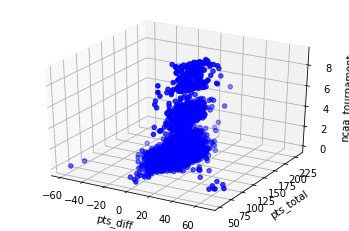

In [96]:



model = sm.ols(formula='ncaa_tournament ~ pts_diff + pts_total', data = df)
fit = model.fit()

fit.summary()

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

ax.scatter(df['pts_diff'], df['pts_total'], df['ncaa_tournament'], c='b', marker='o')

#xx, yy = np.meshgrid(df['pts_diff'], df['pts_total'])

# Not what I expected :(
# ax.plot_surface(xx, yy, fit.fittedvalues)

ax.set_xlabel('pts_diff')
ax.set_ylabel('pts_total')
ax.set_zlabel('ncaa_tournament')

plt.show()


### While the interactive relationship between pts_total and pts_diff is misleading, we do see that  teams that experience low scoring games do tend to not make it past the first round while teams who have close and very high scoring games (over 215 points) tend to make it tot he final four

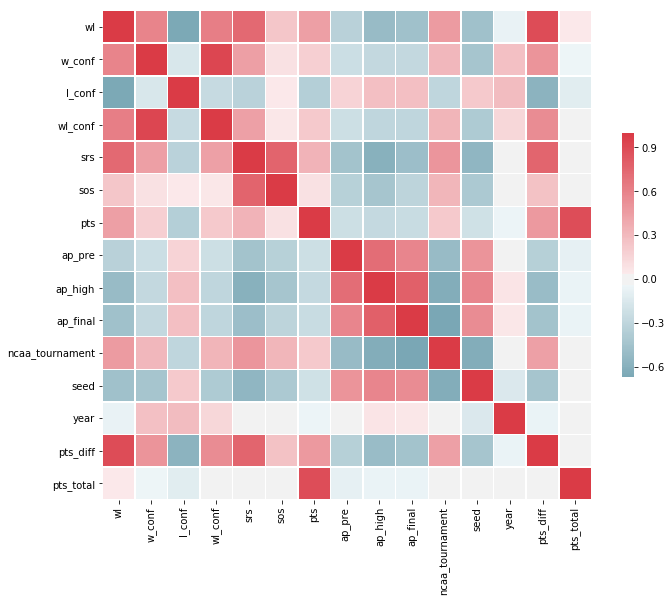

In [97]:

corr = df.corr()

# Generate a mask for the upper triangle

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})



# Find a model


#### Create split for training and test data

#### Explore SVM regression to begin modeling

#### Create function that helps run many models

#### Explore benefits from ensemble learning


In [98]:

df = pd.get_dummies(df, columns=None)

df.replace(np.nan, 0)
df = pd.DataFrame(df)
print(type(df))

df.replace(np.inf,0,inplace = True)
df.shape


<class 'pandas.core.frame.DataFrame'>


(17840, 2591)

In [99]:
df = df[df.loc[:,'year'] != 2019]
#lets look at the dataframe after creating dummie variables
df.head(2)

,wl,w_conf,l_conf,wl_conf,srs,sos,pts,ap_pre,ap_high,ap_final,ncaa_tournament,seed,year,pts_diff,pts_total,conf_A-10,conf_A-Sun,conf_AAC,conf_AAWU,conf_ACC,conf_AEC,conf_ASC,conf_AWC,conf_BIAA,conf_Big 12,conf_Big 7,conf_Big 8,conf_Big East,conf_Big Sky,conf_Big South,conf_Big Ten,conf_Big West,conf_CAA,conf_CBA,conf_CUSA,conf_EAA,conf_ECACM,conf_ECACN,conf_ECACS,conf_ECBL,conf_ECC,conf_GMWC,conf_GSC,conf_GWC,conf_Horizon,conf_Ind,conf_Ivy,conf_MAAC,conf_MAC,conf_MCC,conf_MEAC,conf_MSAC,conf_MVC,conf_MW City,conf_MW Coll,conf_MWC,conf_Metro,conf_Metro NY,conf_Mid-3,conf_Mid-Atl,conf_Mid-Cont,conf_NAC,conf_NEC,conf_NJNY7,conf_OVC,conf_PCAA,conf_PCC,conf_Pac-10,conf_Pac-12,conf_Pac-8,conf_Patriot,conf_SEC,conf_SWAC,conf_SWC,conf_Southern,conf_Southland,conf_Summit,conf_Sun Belt,conf_TAAC,conf_WAC,conf_WCAC,conf_WCC,conf_WNY3,conf_Yankee,coaches_A.B. Williamson,coaches_A.W. Hamilton,coaches_Aaron James,coaches_Abe Lemons,coaches_Adam Walsh,coaches_Adolph Rupp,coaches_Adrian Buoncristiani,coaches_Ajac Triplett,coaches_Aki Thomas,coaches_Al Baggett,coaches_Al Brown,coaches_Al Grushkin,coaches_Al Harden,coaches_Al Lobalbo,coaches_Al McGuire,coaches_Al Seibert,coaches_Al Skinner,coaches_Al Walker,coaches_Alan Kyber,coaches_Alan LeForce,coaches_Alan Major,coaches_Albert Brightman,coaches_Albert E. Negratti,coaches_Albert McClellan,coaches_Alden Pasche,coaches_Alex Severence,coaches_Alfred Robertson,coaches_Allan Freund,coaches_Allen Edwards,coaches_Allen Van Winkle,coaches_Alton Kircher,coaches_Alvin Brooks,coaches_Andre Payne,coaches_Andrew Greer,coaches_Andrew Toole,coaches_Andy Enfield,coaches_Andy Kennedy,coaches_Andy Newman,coaches_Andy Russo,coaches_Andy Stoglin,coaches_Andy Walker,coaches_Anfernee Hardaway,coaches_Anthony Evans,coaches_Anthony Fields,coaches_Anthony Grant,coaches_Anthony Kuolt,coaches_Anthony Latina,coaches_Anthony Packer,coaches_Anthony Solomon,coaches_Anthony Stewart,coaches_Arad McCutchan,coaches_Archie Miller,coaches_Archie Oldham,coaches_Armond Hill,coaches_Art Loche,coaches_Art Perry,coaches_Art Tolis,coaches_Arthur Gallon,coaches_Arthur McLarney,coaches_Ashley Howard,coaches_Austin Claunch,coaches_Avery Johnson,coaches_B.J. Hill,coaches_Babe McCarthy,coaches_Bacari Alexander,coaches_Baker Dunleavy,coaches_Banks McFadden,coaches_Barclay Radebaugh,coaches_Barret Peery,coaches_Barry Collier,coaches_Barry Dowd,coaches_Barry Hinson,coaches_Barry Parkhill,coaches_Barry Rohrssen,coaches_Bart Bellairs,coaches_Bart Lundy,coaches_Bashir Mason,coaches_Bebe Lee,coaches_Ben Betts,coaches_Ben Bluitt,coaches_Ben Braun,coaches_Ben Carnevale,coaches_Ben Howland,coaches_Ben Jacobson,coaches_Ben Jobe,coaches_Ben Kribbs,coaches_Ben Lindsey,coaches_Benjamin Neff,coaches_Benjamin VanAlstyne,coaches_Benjy Taylor,coaches_Bennie Seltzer,coaches_Benny Dees,coaches_Benny Hollis,coaches_Benny Moss,coaches_Berl Huffman,coaches_Bernard Wilson,coaches_Bernie Ockene,coaches_Beryl Shipley,coaches_Bill Bayno,coaches_Bill Berry,coaches_Bill Bibb,coaches_Bill Blair,coaches_Bill Blakeley,coaches_Bill Burke,coaches_Bill C. Foster,coaches_Bill Carmody,coaches_Bill Chandler,coaches_Bill Coen,coaches_Bill Cofield,coaches_Bill Courtney,coaches_Bill Detrick,coaches_Bill Dooley,coaches_Bill E. Foster,coaches_Bill Evans,coaches_Bill Ferguson,coaches_Bill Fitch,coaches_Bill Franey,coaches_Bill Frieder,coaches_Bill Gardiner,coaches_Bill Gibson,coaches_Bill Grier,coaches_Bill Guthridge,coaches_Bill Harrell,coaches_Bill Henderson,coaches_Bill Herrion,coaches_Bill Hodges,coaches_Bill Jones,coaches_Bill Kajikawa,coaches_Bill Kirsch,coaches_Bill Klucas,coaches_Bill Lynn,coaches_Bill Menefee,coaches_Bill Mulligan,coaches_Bill Musselman,coaches_Bill O'Connor,coaches_Bill Oates,coaches_Bill Olson,coaches_Bill Perigo,coaches_Bill Raftery,coaches_Bill Reigel,coaches_Bill Rohr,coaches_Bill Scott,coaches_Bill Self,coaches_Bill Stockton,coaches_Bill Strannigan,coaches_Bill Trumbo,coaches_Bill Turner,coaches_Bill Vesp,coaches_Bill Weimar,coaches_Bill White,coaches

In [100]:
df=pd.DataFrame(df)
X = df.drop('ncaa_tournament', axis =1)
y = df.loc[:,'ncaa_tournament']


In [101]:
X = pd.get_dummies(X, columns=None)

X.replace(np.nan, 0)


X.head()
X.shape
X = pd.DataFrame(X)
X.replace(np.inf,0,inplace = True)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101)



In [102]:
X_test = X_test.astype(np.float64, copy=False)
X_train = X_train.astype(np.float64, copy=False)
y_test = y_test.astype(np.float64, copy=False)
y_train = y_train.astype(np.float64, copy=False)

#np.isnan(X_train).any(), np.isnan(y_train).any(), np.isnan(X_test).any(), np.isnan(y_test).any()

#are the missing zero?

X_train[np.isnan(X_train)] = np.median(X_train[~np.isnan(X_train)])
X_test[np.isnan(X_test)] = np.median(X_test[~np.isnan(X_test)])
y_train[np.isnan(y_train)] = np.median(y_train[~np.isnan(y_train)])
y_test[np.isnan(y_test)] = np.median(y_test[~np.isnan(y_test)])


## XGBoost


In [103]:
#Fit an XGBoost model

param = {'max_depth': 2, 'eta': 1, 'silent': 1}
param['nthread'] = 4
param['eval_metric'] = 'auc'
#You can also specify multiple eval metrics:

param['eval_metric'] = ['auc', 'ams@0']
dtrain = xgb.DMatrix(X_train, label=y_train, missing=-999.0)
dtest = xgb.DMatrix(X_test, label=y_test, missing=-999.0)

evallist = [(dtest, 'eval'), (dtrain, 'train')]


num_round = 10
bst = xgb.train(param, dtrain, num_round, evallist)

bst.save_model('0001.model')

# dump model
bst.dump_model('dump.raw.txt')
# dump model with feature map
bst.dump_model('dump.raw.txt')

#A saved model can be loaded as follows:

bst = xgb.Booster({'nthread': 4})  # init model


[0]	eval-auc:1.24728	eval-ams@0:41.7703	train-auc:1.21007	train-ams@0:83.744
[1]	eval-auc:1.24908	eval-ams@0:41.7703	train-auc:1.21142	train-ams@0:83.744
[2]	eval-auc:1.3047	eval-ams@0:41.7703	train-auc:1.27211	train-ams@0:83.744
[3]	eval-auc:1.305	eval-ams@0:42.2142	train-auc:1.2779	train-ams@0:84.1506
[4]	eval-auc:1.31187	eval-ams@0:42.2684	train-auc:1.2878	train-ams@0:84.3735
[5]	eval-auc:1.31188	eval-ams@0:42.2684	train-auc:1.28922	train-ams@0:84.5159
[6]	eval-auc:1.30278	eval-ams@0:42.2684	train-auc:1.2898	train-ams@0:84.648
[7]	eval-auc:1.30498	eval-ams@0:41.9613	train-auc:1.29164	train-ams@0:84.1685
[8]	eval-auc:1.30442	eval-ams@0:41.9613	train-auc:1.29211	train-ams@0:84.225
[9]	eval-auc:1.30587	eval-ams@0:41.9613	train-auc:1.29144	train-ams@0:83.8519


In [104]:
y_pred = []
def xgb_model(X_train, y_train, X_test, y_test):
    dtrain = xgb.DMatrix(X_train, label=y_train, missing=-999.0)
    dtest = xgb.DMatrix(X_test, label=y_test, missing=-999.0)

    evallist = [(dtest, 'eval'), (dtrain, 'train')]


    num_round = 10
    clf = xgb.train(param, dtrain, num_round, evallist)

    ypred = clf.predict(dtest)
    #clf.plot_importance(bst)
    labels = dtest.get_label()
    y_pred = ypred
    #X_train['predMake'] = clf.predict(X_train)
    return(ypred)

In [105]:

xgb_model(X_train, y_train, X_test, y_test)


[0]	eval-auc:1.24728	eval-ams@0:41.7703	train-auc:1.21007	train-ams@0:83.744
[1]	eval-auc:1.24908	eval-ams@0:41.7703	train-auc:1.21142	train-ams@0:83.744
[2]	eval-auc:1.3047	eval-ams@0:41.7703	train-auc:1.27211	train-ams@0:83.744
[3]	eval-auc:1.305	eval-ams@0:42.2142	train-auc:1.2779	train-ams@0:84.1506
[4]	eval-auc:1.31187	eval-ams@0:42.2684	train-auc:1.2878	train-ams@0:84.3735
[5]	eval-auc:1.31188	eval-ams@0:42.2684	train-auc:1.28922	train-ams@0:84.5159
[6]	eval-auc:1.30278	eval-ams@0:42.2684	train-auc:1.2898	train-ams@0:84.648
[7]	eval-auc:1.30498	eval-ams@0:41.9613	train-auc:1.29164	train-ams@0:84.1685
[8]	eval-auc:1.30442	eval-ams@0:41.9613	train-auc:1.29211	train-ams@0:84.225
[9]	eval-auc:1.30587	eval-ams@0:41.9613	train-auc:1.29144	train-ams@0:83.8519


array([ 2.5261362 ,  0.14979748, -0.00473063, ..., -0.00473063,
        1.482985  ,  0.14979748], dtype=float32)

In [106]:
dtrain = xgb.DMatrix(X_train, label=y_train, missing=-999.0)
dtest = xgb.DMatrix(X_test, label=y_test, missing=-999.0)

evallist = [(dtest, 'eval'), (dtrain, 'train')]


num_round = 10
X = X.astype(np.float64, copy=False)
y = y.astype(np.float64, copy=False)

#np.isnan(X_train).any(), np.isnan(y_train).any(), np.isnan(X_test).any(), np.isnan(y_test).any()

#are the missing zero?

X[np.isnan(X)] = np.median(X[~np.isnan(X)])
y[np.isnan(y)] = np.median(y[~np.isnan(y)])

clf = xgb.train(param, dtrain, num_round, evallist)
dfinal = xgb.DMatrix(X, label=y, missing=-999.0)

ypred = clf.predict(dfinal)
#clf.plot_importance(bst)
labels = dtest.get_label()
y['predMake'] = clf.predict(dfinal)


[0]	eval-auc:1.24728	eval-ams@0:41.7703	train-auc:1.21007	train-ams@0:83.744
[1]	eval-auc:1.24908	eval-ams@0:41.7703	train-auc:1.21142	train-ams@0:83.744
[2]	eval-auc:1.3047	eval-ams@0:41.7703	train-auc:1.27211	train-ams@0:83.744
[3]	eval-auc:1.305	eval-ams@0:42.2142	train-auc:1.2779	train-ams@0:84.1506
[4]	eval-auc:1.31187	eval-ams@0:42.2684	train-auc:1.2878	train-ams@0:84.3735
[5]	eval-auc:1.31188	eval-ams@0:42.2684	train-auc:1.28922	train-ams@0:84.5159
[6]	eval-auc:1.30278	eval-ams@0:42.2684	train-auc:1.2898	train-ams@0:84.648
[7]	eval-auc:1.30498	eval-ams@0:41.9613	train-auc:1.29164	train-ams@0:84.1685
[8]	eval-auc:1.30442	eval-ams@0:41.9613	train-auc:1.29211	train-ams@0:84.225
[9]	eval-auc:1.30587	eval-ams@0:41.9613	train-auc:1.29144	train-ams@0:83.8519


In [107]:
ypred = pd.DataFrame(ypred)
ypred.head()

,0
0,-0.004731
1,-0.004731
2,-0.004731
3,-0.004731
4,-0.004731


In [108]:
X['predict'] = ypred
X.head()

wl  w_conf  l_conf  wl_conf    srs   sos   pts  ap_pre  ap_high  \
1  0.500     8.0    10.0    0.444  -9.14 -6.82  73.7    30.0     30.0   
2  0.448     7.0    11.0    0.389 -11.86 -7.10  69.3    30.0     30.0   
3  0.419     8.0    10.0    0.444 -13.93 -7.53  71.3    30.0     30.0   
4  0.323     4.0    14.0    0.222 -17.20 -6.34  63.7    30.0     30.0   
5  0.355     2.0    12.0    0.143 -19.60 -4.12  71.4    30.0     30.0   

   ap_final  seed    year  pts_diff  pts_total  conf_A-10  conf_A-Sun  \
1      30.0  20.0  2018.0       2.5      144.9        0.0         0.0   
2      30.0  20.0  2017.0      -2.2      140.8        0.0         0.0   
3      30.0  20.0  2016.0      -2.0      144.6        0.0         0.0   
4      30.0  20.0  2015.0      -6.8      134.2        0.0         0.0   
5      30.0  20.0  2014.0      -0.5      143.3        0.0         0.0   

   conf_AAC  conf_AAWU  conf_ACC  conf_AEC  conf_ASC  conf_AWC  conf_BIAA  \
1       0.0        0.0       0.0       0.0       0.0       0.0        0.0   
2       0.0        0.0       0.0       0.0       0.0       0.0        0.0   
3       0.0        0.0       0.0       0.0       0.0       0.0        0.0   
4       0.0        0.0       0.0       0.0       0.0       0.0        0.0   
5       0.0        0.0       0.0       0.0       0.0       0.0        0.0   

   conf_Big 12  conf_Big 7  conf_Big 8  conf_Big East  conf_Big Sky  \
1          0.0         0.0         0.0            0.0           0.0   
2          0.0         0.0         0.0            0.0           0.0   
3          0.0         0.0         0.0            0.0           0.0   
4          0.0         0.0         0.0            0.0           0.0   
5          0.0         0.0         0.0            0.0           0.0   

   conf_Big South  conf_Big Ten  conf_Big West  conf_CAA  conf_CBA  conf_CUSA  \
1             0.0           0.0            0.0       0.0       0.0        0.0   
2             0.0           0.0            0.0       0.0       0.0        0.0   
3             0.0           0.0            0.0       0.0       0.0        0.0   
4             0.0           0.0            0.0       0.0       0.0        0.0   
5             0.0           0.0            0.0       0.0       0.0        0.0   

   conf_EAA  conf_ECACM  conf_ECACN  conf_ECACS  conf_ECBL  conf_ECC  \
1       0.0         0.0         0.0         0.0        0.0       0.0   
2       0.0         0.0         0.0         0.0        0.0       0.0   
3       0.0         0.0         0.0         0.0        0.0       0.0   
4       0.0         0.0         0.0         0.0        0.0       0.0   
5       0.0         0.0         0.0         0.0        0.0       0.0   

   conf_GMWC  conf_GSC  conf_GWC  conf_Horizon  conf_Ind  conf_Ivy  conf_MAAC  \
1        0.0       0.0       0.0           0.0       0.0       0.0        0.0   
2        0.0       0.0       0.0           0.0       0.0       0.0        0.0   
3        0.0       0.0       0.0           0.0       0.0       0.0        0.0   
4        0.0       0.0       0.0           0.0       0.0       0.0        0.0   
5        0.0       0.0       0.0           0.0       0.0       0.0        0.0   

   conf_MAC  conf_MCC  conf_MEAC  conf_MSAC  conf_MVC  conf_MW City  \
1       0.0       0.0        0.0        0.0       0.0           0.0   
2       0.0       0.0        0.0        0.0       0.0           0.0   
3       0.0       0.0        0.0        0.0       0.0           0.0   
4       0.0       0.0        0.0        0.0       0.0           0.0   
5       0.0       0.0        0.0        0.0       0.0           0.0   

   conf_MW Coll  conf_MWC  conf_Metro  conf_Metro NY  conf_Mid-3  \
1           0.0       0.0         0.0            0.0         0.0   
2           0.0       0.0         0.0            0.0         0.0   
3           0.0       0.0         0.0            0.0         0.0   
4           0.0       0.0         0.0            0.0         0.0   
5           0.0       0.0         0.0            0.0         0.0

In [109]:
X.groupby(['predict']).agg(['count'])

wl w_conf l_conf wl_conf    srs    sos    pts ap_pre ap_high  \
           count  count  count   count  count  count  count  count   count   
predict                                                                      
-0.846989      2      2      2       2      2      2      2      2       2   
-0.834728      1      1      1       1      1      1      1      1       1   
-0.456524      1      1      1       1      1      1      1      1       1   
-0.425841      1      1      1       1      1      1      1      1       1   
-0.343371      4      4      4       4      4      4      4      4       4   
-0.186190      1      1      1       1      1      1      1      1       1   
-0.184112      1      1      1       1      1      1      1      1       1   
-0.158701      7      7      7       7      7      7      7      7       7   
-0.155821     26     26     26      26     26     26     26     26      26   
-0.094289      1      1      1       1      1      1      1      1       1   
-0.004731  10406  10406  10406   10406  10406  10406  10406  10406   10406   
 0.007365     23     23     23      23     23     23     23     23      23   
 0.007530     11     11     11      11     11     11     11     11      11   
 0.068897      2      2      2       2      2      2      2      2       2   
 0.088851      1      1      1       1      1      1      1      1       1   
 0.149797   1353   1353   1353    1353   1353   1353   1353   1353    1353   
 0.158455   1072   1072   1072    1072   1072   1072   1072   1072    1072   
 0.162058      2      2      2       2      2      2      2      2       2   
 0.170716      3      3      3       3      3      3      3      3       3   
 0.234755      1      1      1       1      1      1      1      1       1   
 0.239941      4      4      4       4      4      4      4      4       4   
 0.252037      2      2      2       2      2      2      2      2       2   
 0.262447      2      2      2       2      2      2      2      2       2   
 0.276096      1      1      1       1      1      1      1      1       1   
 0.312984    525    525    525     525    525    525    525    525     525   
 0.323012      1      1      1       1      1      1      1      1       1   
 0.325244     22     22     22      22     22     22     22     22      22   
 0.403128      2      2      2       2      2      2      2      2       2   
 0.415388      1      1      1       1      1      1      1      1       1   
 0.416417    230    230    230     230    230    230    230    230     230   
...          ...    ...    ...     ...    ...    ...    ...    ...     ...   
 5.919724     25     25     25      25     25     25     25     25      25   
 5.931985      2      2      2       2      2      2      2      2       2   
 5.983542      3      3      3       3      3      3      3      3       3   
 6.202871      1      1      1       1      1      1      1      1       1   
 6.247941      1      1      1       1      1      1      1      1       1   
 6.261590      2      2      2       2      2      2      2      2       2   
 6.288266      3      3      3       3      3      3      3      3       3   
 6.313704      1      1      1       1      1      1      1      1       1   
 6.565518      1      1      1       1      1      1      1      1       1   
 6.646492      1      1      1       1      1      1      1      1       1   
 6.660141      8      8      8       8      8      8      8      8       8   
 6.672402      4      4      4       4      4      4      4      4       4   
 6.723959      2      2      2       2      2      2      2      2       2   
 6.759428      6      6      6       6      6      6      6      6       6   
 6.860275      1      1      1       1      1      1      1      1       1   
 6.947888      3      3      3       3      3      3      3      3       3   
 7.115913      1      1      1       1      1      1      1      1       1   
 7.237609     14     14     14      